# Check GPU

In [ ]:
for i in range(20,30):
  print(i)

20
21
22
23
24
25
26
27
28
29


In [ ]:
!nvidia-smi

Thu Apr 28 16:41:46 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8    26W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Mount Google Drive

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import Libraries

In [ ]:
!pip install -U tensorboard-plugin-profile

     |████████████████████████████████| 5.3 MB 4.8 MB/s 


In [ ]:
import pandas as pd
import numpy as np
from numpy.linalg import svd
import seaborn as sns
from tabulate import tabulate
import datetime
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from PIL import Image as PIL_Image
from time import time
import random

from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn.metrics import classification_report, confusion_matrix  
from sklearn.model_selection import GridSearchCV


from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, TensorBoard
from tensorflow.keras.regularizers import L2
from keras import regularizers

# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


# Dataset Preprocessing

In [ ]:
# # Unzip dataset
# !unzip '/content/drive/MyDrive/SYDE 522 Project/Dataset/dataset.zip' -d '/content/drive/MyDrive/SYDE 522 Project/Dataset/dataset' 

In [ ]:
# Display contents of the dataset folder
!ls '/content/drive/MyDrive/SYDE 522 Project/Dataset/dataset'

american_sign_language.PNG  sign_mnist_test	 sign_mnist_train.csv
amer_sign2.png		    sign_mnist_test.csv
amer_sign3.png		    sign_mnist_train


In [ ]:
# Define paths to read train and test data
train_path = '/content/drive/MyDrive/SYDE 522 Project/Dataset/dataset/sign_mnist_train.csv'
test_path = '/content/drive/MyDrive/SYDE 522 Project/Dataset/dataset/sign_mnist_test.csv'

In [ ]:
# Read train and test data as pandas dataframe
train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)

In [ ]:
# Print train data head
train_data.head()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,3,107,118,127,134,139,143,146,150,153,...,207,207,207,207,206,206,206,204,203,202
1,6,155,157,156,156,156,157,156,158,158,...,69,149,128,87,94,163,175,103,135,149
2,2,187,188,188,187,187,186,187,188,187,...,202,201,200,199,198,199,198,195,194,195
3,2,211,211,212,212,211,210,211,210,210,...,235,234,233,231,230,226,225,222,229,163
4,13,164,167,170,172,176,179,180,184,185,...,92,105,105,108,133,163,157,163,164,179


In [ ]:
# Describe train data
train_data.describe()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
count,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,...,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000
mean,12.318813,145.419377,148.500273,151.247714,153.546531,156.210891,158.411255,160.472154,162.339683,163.954799,...,141.104863,147.495611,153.325806,159.125332,161.969259,162.736696,162.906137,161.966454,161.137898,159.824731
std,7.287552,41.358555,39.942152,39.056286,38.595247,37.111165,36.125579,35.016392,33.661998,32.651607,...,63.751194,65.512894,64.427412,63.708507,63.738316,63.444008,63.509210,63.298721,63.610415,64.396846
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.000000,121.000000,126.000000,130.000000,133.000000,137.000000,140.000000,142.000000,144.000000,146.000000,...,92.000000,96.000000,103.000000,112.000000,120.000000,125.000000,128.000000,128.000000,128.000000,125.500000
50%,13.000000,150.000000,153.000000,156.000000,158.000000,160.000000,162.000000,164.000000,165.000000,166.000000,...,144.000000,162.000000,172.000000,180.000000,183.000000,184.000000,184.000000,182.000000,182.000000,182.000000
75%,19.000000,174.000000,176.000000,178.000000,179.000000,181.000000,182.000000,183.000000,184.000000,185.000000,...,196.000000,202.000000,205.000000,207.000000,208.000000,207.000000,207.000000,206.000000,204.000000,204.000000
max,24.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000


In [ ]:
# Train data info
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27455 entries, 0 to 27454
Columns: 785 entries, label to pixel784
dtypes: int64(785)
memory usage: 164.4 MB


In [ ]:
# Print shapes of data
print("Shape of train data = ", train_data.shape)
print("Shape of test data = ", test_data.shape)

Shape of train data =  (27455, 785)
Shape of test data =  (7172, 785)


## Define X and y

In [ ]:
# X_train and y_train in dataframe format
X_train_df = train_data.drop(columns=['label'])
y_train_df = train_data.loc[:, 'label']
X_test_df = test_data.drop(columns=['label'])
y_test_df = test_data.loc[:, 'label']

print("Shape of X_train_df = ", X_train_df.shape)
print("Shape of y_train_df = ", y_train_df.shape)
print("Shape of X_test_df = ", X_test_df.shape)
print("Shape of y_test_df = ", y_test_df.shape)

Shape of X_train_df =  (27455, 784)
Shape of y_train_df =  (27455,)
Shape of X_test_df =  (7172, 784)
Shape of y_test_df =  (7172,)


In [ ]:
# Define X_train and y_train
X_train = np.array(X_train_df)
y_train = np.array(y_train_df)

labels = np.sort(np.unique(y_train_df))

print("Shape of X_train = ", X_train.shape)
print("Shape of y_train = ", y_train.shape)
print("Labels = ", labels)

Shape of X_train =  (27455, 784)
Shape of y_train =  (27455,)
Labels =  [ 0  1  2  3  4  5  6  7  8 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]


In [ ]:
# Define X_test and y_test
X_test = np.array(X_test_df)
y_test = np.array(y_test_df)
print("Shape of X_test = ", X_test.shape)
print("Shape of y_test = ", y_test.shape)

Shape of X_test =  (7172, 784)
Shape of y_test =  (7172,)


# Exploratory Data Analysis

In [ ]:
# Number of samples from each class
label_samples = y_train_df.value_counts().sort_index()
print(label_samples)

0     1126
1     1010
2     1144
3     1196
4      957
5     1204
6     1090
7     1013
8     1162
10    1114
11    1241
12    1055
13    1151
14    1196
15    1088
16    1279
17    1294
18    1199
19    1186
20    1161
21    1082
22    1225
23    1164
24    1118
Name: label, dtype: int64


In [ ]:
# Define dictionary of labels mapping to letters
letters = "ABCDEFGHIJKLMNOPQRSTUVWXYZ"

# Missing letters due to gesture motions
missing_letters = ['J', 'Z']

# Dictionary mapping labels to letters
labels_dict = {}

for i in range(len(letters)):
    if letters[i] not in missing_letters:
        labels_dict[i] = letters[i]

print(labels_dict)

{0: 'A', 1: 'B', 2: 'C', 3: 'D', 4: 'E', 5: 'F', 6: 'G', 7: 'H', 8: 'I', 10: 'K', 11: 'L', 12: 'M', 13: 'N', 14: 'O', 15: 'P', 16: 'Q', 17: 'R', 18: 'S', 19: 'T', 20: 'U', 21: 'V', 22: 'W', 23: 'X', 24: 'Y'}


## Count Plot

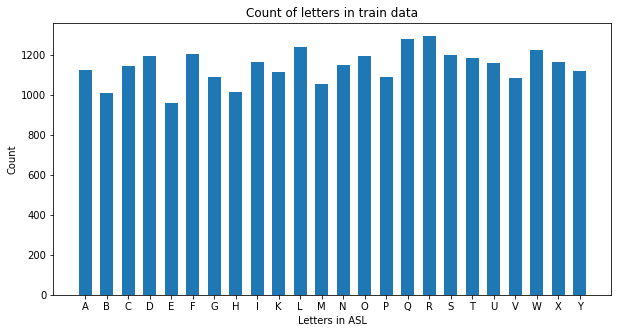

In [ ]:
count = list(label_samples)

fig = plt.figure(figsize = (10, 5))
 
# Creating the bar plot
plt.bar(list(labels_dict.values()), count, width=0.6)

plt.xlabel("Letters in ASL")
plt.ylabel("Count")
plt.title("Count of letters in train data")
plt.savefig('class-count-plot')
plt.show()

In [ ]:
max_idx = np.argmax(count)
if max_idx >= 9:
    max_idx += 1

min_idx = np.argmin(count)
if min_idx >= 9:
    min_idx += 1

diff = max(count) - min(count)

print("Class with maximum count = ", labels_dict[max_idx])
print("Class with minimum count = ", labels_dict[min_idx])
print("Max count = ", max(count))
print("Min count = ", min(count))
print("Difference between class with the highest and lowest count = ", diff)

Class with maximum count =  R
Class with minimum count =  E
Max count =  1294
Min count =  957
Difference between class with the highest and lowest count =  337


## Display Letters

In [ ]:
def display_letters(X, y, labels):
  # Create subplots
  fig, ax = plt.subplots(4, 6, figsize=(16, 10))
  ax = ax.flatten()

  # for loop to display one of each letter
  # Iterate over each label
  for i, label in enumerate(labels):
    # Get index of the first letter of the label
    index = np.where(y == label)[0][0]

    ax[i].set_title(f'{labels_dict[label]}')
    # Reshape 784 to 28x28 and print
    ax[i].imshow(X[index].reshape(28,28), cmap=plt.get_cmap("gray"))
    ax[i].axis('off')

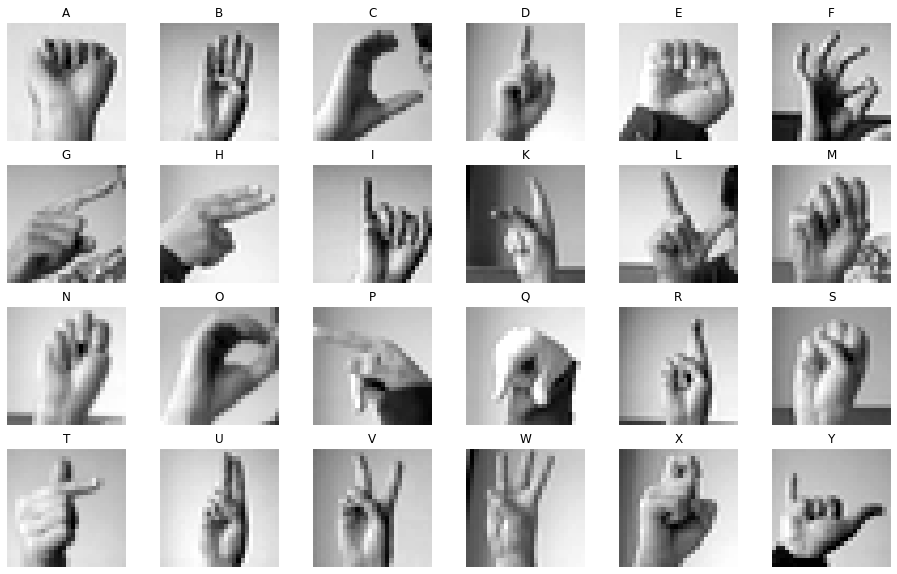

In [ ]:
# Call the function to display train digits
display_letters(X_train, y_train, labels)

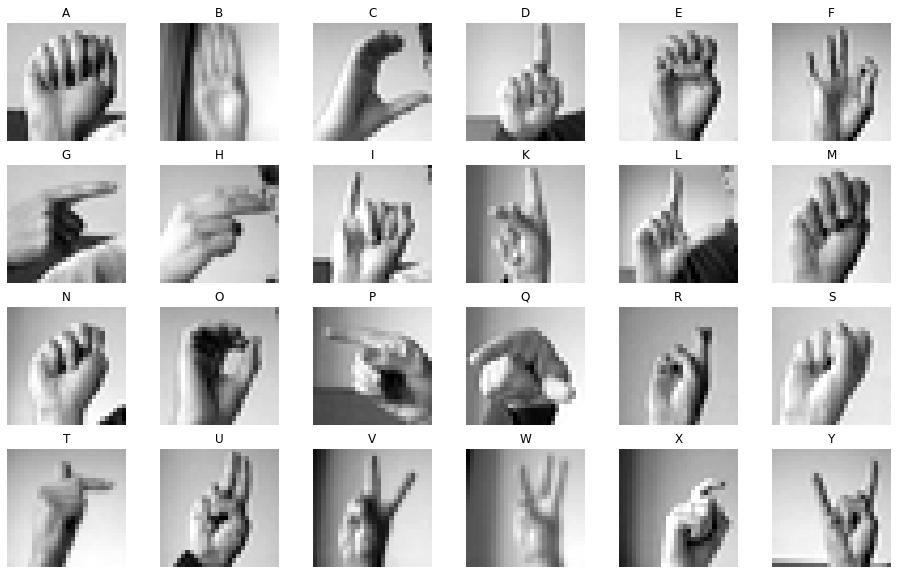

In [ ]:
# Call the function to display test digits
display_letters(X_test, y_test, labels)

# Normalization

In [ ]:
scaler = StandardScaler().fit(X_train)

# Normalize train data
X_train_normalized = scaler.transform(X_train)

# Normalize test data
X_test_normalized = scaler.transform(X_test)

## Average Face

Shape of average face =  (784,)


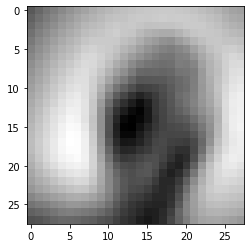

In [ ]:
# Calculate average face by taking mean across all pixels
avg_face = X_train.mean(axis=0)

print("Shape of average face = ", avg_face.shape)

# Display the average image
plt.imshow(avg_face.reshape(28, 28), cmap = plt.get_cmap("gray"))
plt.show()

## Normalized by Subtracting Mean

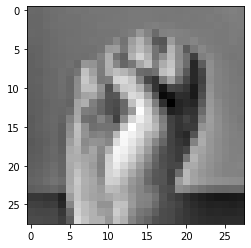

In [ ]:
# Subtract mean face from train data
X_train_mean_norm = X_train - avg_face

# Display the subtracted image
plt.imshow(X_train_mean_norm[10, :].reshape(28, 28), cmap = plt.get_cmap("gray"))
plt.show()

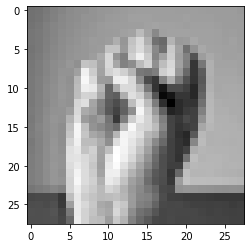

In [ ]:
# Comparing the subtracted image from the original image
plt.imshow(X_train[10, :].reshape(28, 28), cmap = plt.get_cmap("gray"))
plt.show()

# Dimensionality Reduction

## PCA


In [ ]:
# Apply PCA
pca = PCA(n_components=100)

pca.fit(X_train_normalized)

PCA(n_components=100)

### Plot PCA components

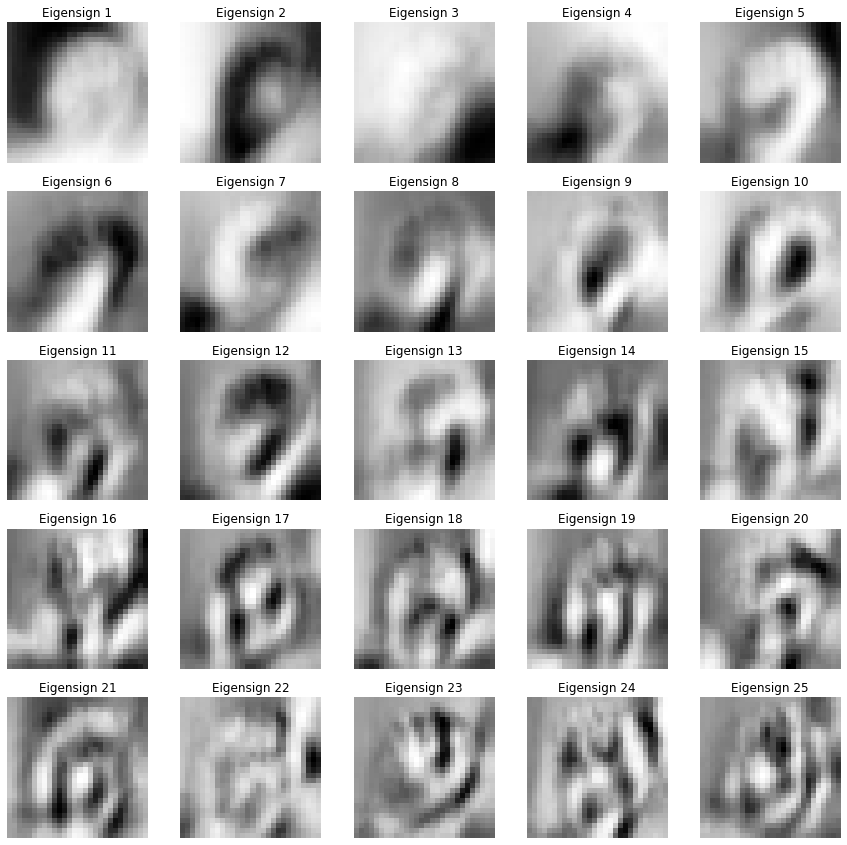

In [ ]:
# Plot first 25 components PCA components
plt.figure(figsize=(15, 15))
for i, component in enumerate(pca.components_[:25]):
    plt.subplot(5, 5, i+1)
    plt.imshow(component.reshape(28, 28), cmap='Greys_r')
    plt.title(f"Eigensign {i+1}")
    plt.axis('off')

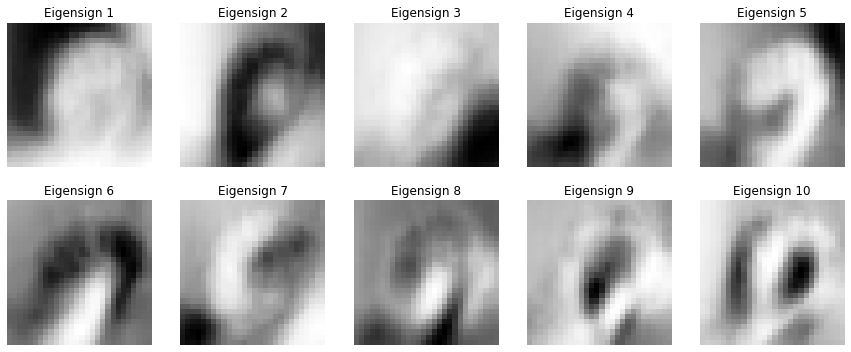

In [ ]:
# Plot first 10 components PCA components
plt.figure(figsize=(15, 6))
for i, component in enumerate(pca.components_[:10]):
    plt.subplot(2, 5, i+1)
    plt.imshow(component.reshape(28, 28), cmap='Greys_r')
    plt.title(f"Eigensign {i+1}")
    plt.axis('off')
plt.savefig('eigensigns')

### PCA transformed data

In [ ]:
X_train_pca = pca.transform(X_train_normalized)
print("Shape of X_train after applying PCA = :", X_train_pca.shape)

Shape of X_train after applying PCA = : (27455, 100)


### Plot of PCA Components

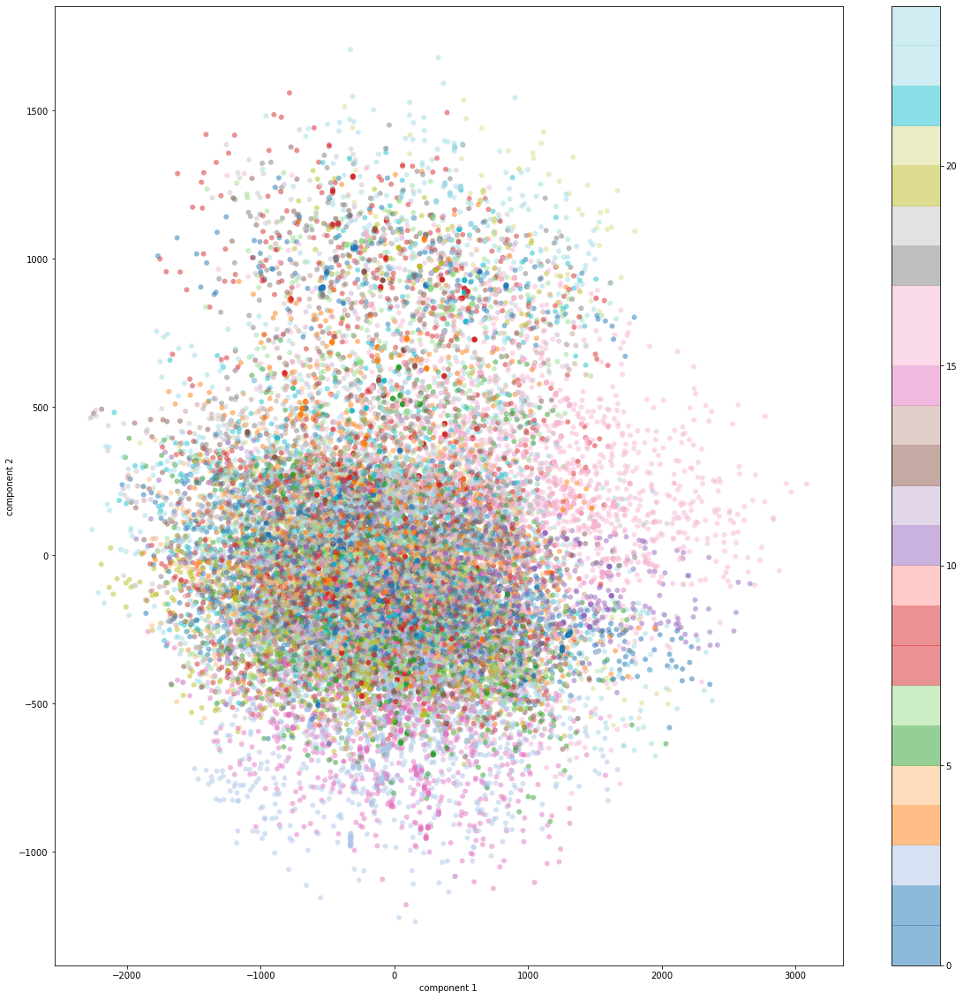

In [ ]:
fig = plt.figure(figsize = (20, 20)) # Figure size
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1],
            c=y_train,
            edgecolor='none',
            alpha=0.5,
            cmap=plt.cm.get_cmap('tab20', 24)
           )

plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar();

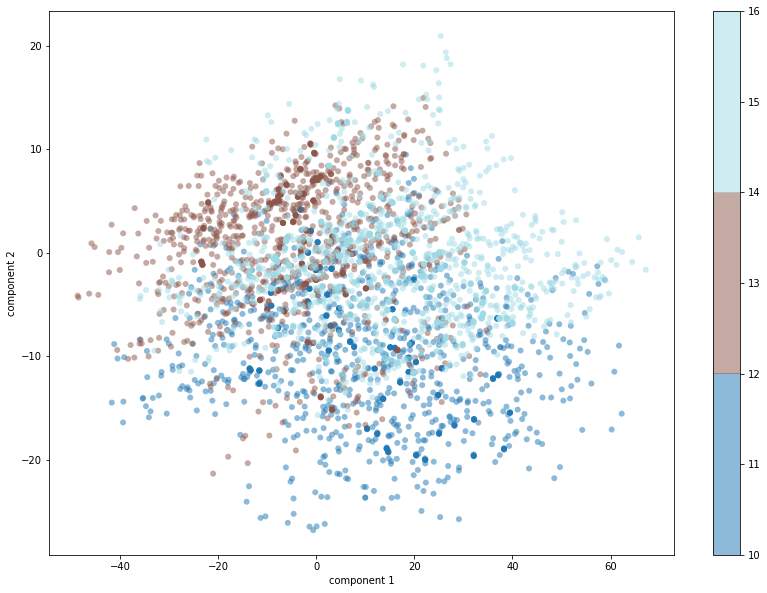

In [ ]:
# Plot few classes
classes = [10, 13, 16]

class_slice = []

for cls in classes:
    if not len(class_slice):
        class_slice = list(np.where(y_train == cls)[0])     
    else:
        class_slice.extend(np.where(y_train == cls)[0])

fig = plt.figure(figsize = (14, 10)) # Figure size
plt.scatter(X_train_pca[class_slice, 0],
            X_train_pca[class_slice, 1],
            c=y_train[class_slice],
            edgecolor='none',
            alpha=0.5,
            cmap=plt.cm.get_cmap('tab20', len(classes))
           )

plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar()

### Plot of singular values and variance

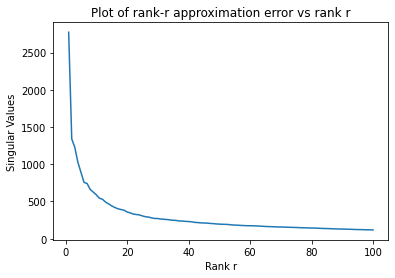

In [ ]:
# Plot approximation error vs rank r
plt.plot(range(1, 101), pca.singular_values_)
plt.title("Plot of rank-r approximation error vs rank r")
plt.xlabel("Rank r")
plt.ylabel("Singular Values")
plt.show()

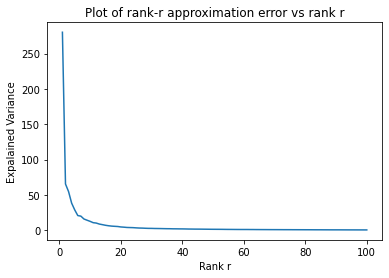

In [ ]:
# Plot approximation error vs rank r
plt.plot(range(1, 101), pca.explained_variance_)
plt.title("Plot of rank-r approximation error vs rank r")
plt.xlabel("Rank r")
plt.ylabel("Expalained Variance")
plt.show()

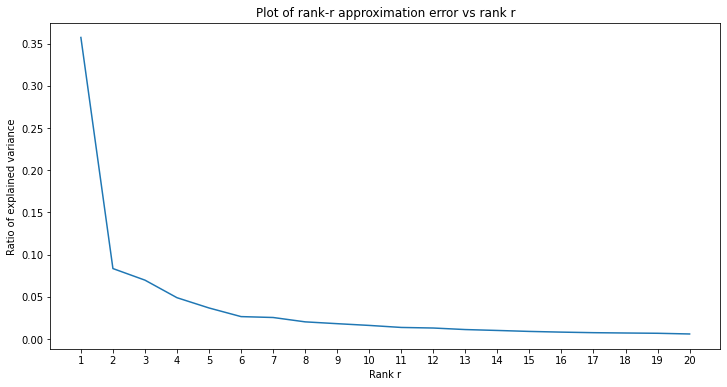

In [ ]:
# Plot approximation error vs rank r
rank = 20

plt.figure(figsize=(12,6))
plt.plot(range(1, rank+1), pca.explained_variance_ratio_[:rank])
plt.title("Plot of rank-r approximation error vs rank r")
plt.xlabel("Rank r")
plt.ylabel("Ratio of explained variance")

plt.xticks(range(1, rank+1))
plt.savefig("explained-variance-ratio")
plt.show()

In [ ]:
print(f"Explained variance using first {rank} components = ", sum(pca.explained_variance_ratio_[:rank]))

Explained variance using first 20 components =  0.7956806289169936


## LDA

In [ ]:
lda = LinearDiscriminantAnalysis()

lda.fit(X_train_normalized, y_train)

LinearDiscriminantAnalysis()

### LDA transformed data

In [ ]:
X_train_lda = lda.transform(X_train_normalized)
print("Shape of X_train after applying lda = :", X_train_lda.shape)

Shape of X_train after applying lda = : (27455, 23)


### Plot of LDA Components

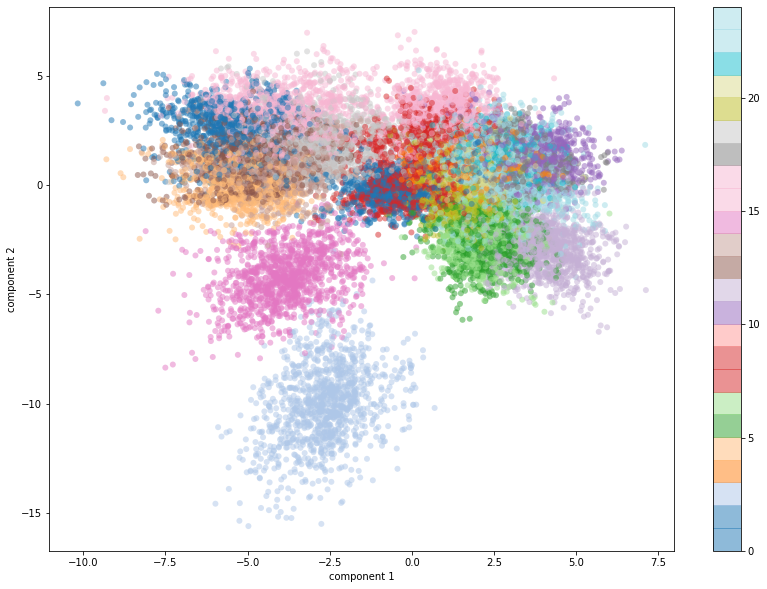

In [ ]:
# Scatter plot all classes
fig = plt.figure(figsize = (14, 10)) # Figure size
plt.scatter(X_train_lda[:, 0],
            X_train_lda[:, 1],
            c=y_train[:],
            edgecolor='none',
            alpha=0.5,
            cmap=plt.cm.get_cmap('tab20', 24)
           )

plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar()
plt.savefig('lda-scatter-plot')

### Plot of variance

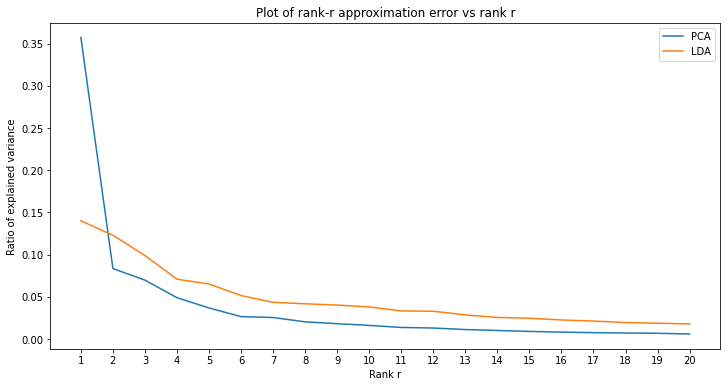

In [ ]:
# Plot variance vs rank r
rank = 20

plt.figure(figsize=(12,6))
plt.plot(range(1, rank+1), pca.explained_variance_ratio_[:rank], label='PCA')
plt.plot(range(1, rank+1), lda.explained_variance_ratio_[:rank], label='LDA')
plt.title("Plot of rank-r approximation error vs rank r")
plt.xlabel("Rank r")
plt.ylabel("Ratio of explained variance")
plt.xticks(range(1, rank+1))
plt.savefig("explained-variance-ratio", dpi=150)
plt.legend()
plt.show()

In [ ]:
print(f"Explained variance using first {rank} components = ", sum(lda.explained_variance_ratio_[:rank]))

Explained variance using first 20 components =  0.9578056883450959


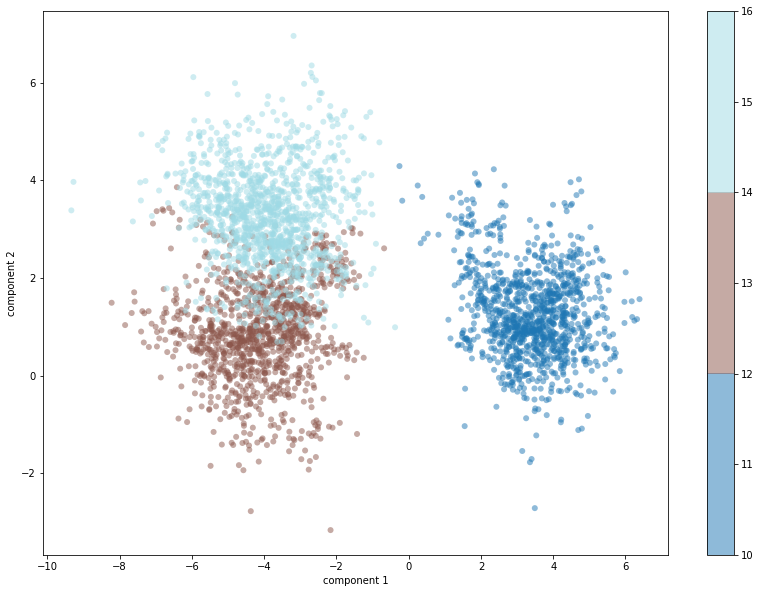

In [ ]:
# Scatter plot few classes

classes = [10, 13, 16]

class_slice = []

for cls in classes:
    if not len(class_slice):
        class_slice = list(np.where(y_train == cls)[0])     
    else:
        class_slice.extend(np.where(y_train == cls)[0])

fig = plt.figure(figsize = (14, 10)) # Figure size
plt.scatter(X_train_lda[class_slice, 0],
            X_train_lda[class_slice, 1],
            c=y_train[class_slice],
            edgecolor='none',
            alpha=0.5,
            cmap=plt.cm.get_cmap('tab20', len(classes))
           )

plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar()

## Autoencoder

In [ ]:
X_train_scaled = X_train.astype('float32')/255.
print("Shape of X_train_scaled = ", X_train_scaled.shape)

X_test_scaled = X_test.astype('float32')/255.
print("Shape of X_test_scaled = ", X_test_scaled.shape)

Shape of X_train_scaled =  (27455, 784)
Shape of X_test_scaled =  (7172, 784)


### Autoencoder model

In [ ]:
# This is the size of our encoded representations
encoding_dim = 64  # 64 floats -> compression of factor 12.25, assuming the input is 784 floats

input_img = keras.Input(shape=(784,))
encoded = layers.Dense(256, activation='relu')(input_img)
encoded = layers.Dense(128, activation='relu')(encoded)
encoded = layers.Dense(encoding_dim, activation='relu')(encoded)

decoded = layers.Dense(128, activation='relu')(encoded)
decoded = layers.Dense(256, activation='relu')(decoded)
decoded = layers.Dense(784, activation='sigmoid')(decoded)

# Model to map an input to its reconstruction
autoencoder = keras.Model(input_img, decoded)

# Model to map an input to its encoded representation
encoder = keras.Model(input_img, encoded)

In [ ]:
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

### Plot of AE architecture

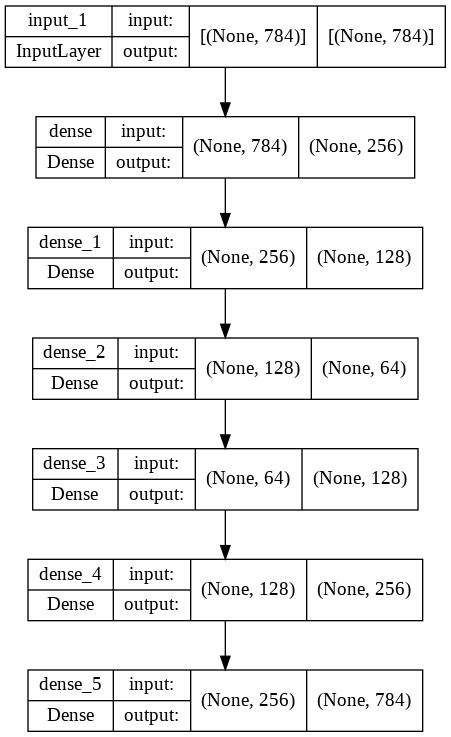

In [ ]:
keras.utils.plot_model(autoencoder, "autoencoder-arc.png", show_shapes=True)

### Model training

In [ ]:
autoencoder.fit(X_train_scaled, X_train_scaled,
                epochs=100,
                batch_size=256,
                shuffle=True,
                validation_data=(X_test_scaled, X_test_scaled))

Epoch 1/100
108/108 [==============================] - 4s 6ms/step - loss: 0.6437 - val_loss: 0.6223
Epoch 2/100
108/108 [==============================] - 0s 4ms/step - loss: 0.6190 - val_loss: 0.6098
Epoch 3/100
108/108 [==============================] - 1s 5ms/step - loss: 0.6099 - val_loss: 0.6033
Epoch 4/100
108/108 [==============================] - 1s 5ms/step - loss: 0.6047 - val_loss: 0.6014
Epoch 5/100
108/108 [==============================] - 1s 5ms/step - loss: 0.6029 - val_loss: 0.5981
Epoch 6/100
108/108 [==============================] - 1s 5ms/step - loss: 0.6011 - val_loss: 0.5968
Epoch 7/100
108/108 [==============================] - 1s 5ms/step - loss: 0.6000 - val_loss: 0.5958
Epoch 8/100
108/108 [==============================] - 1s 5ms/step - loss: 0.5990 - val_loss: 0.5955
Epoch 9/100
108/108 [==============================] - 1s 5ms/step - loss: 0.5980 - val_loss: 0.5950
Epoch 10/100
108/108 [==============================] - 1s 5ms/step - loss: 0.5974 - val_lo

### AE transformed data

In [ ]:
# Encode and decode some digits
# Note that we take them from the *test* set
encoded_imgs = encoder.predict(X_test_scaled)
decoded_imgs = autoencoder.predict(X_test_scaled)

### Plot of original and reconstruction

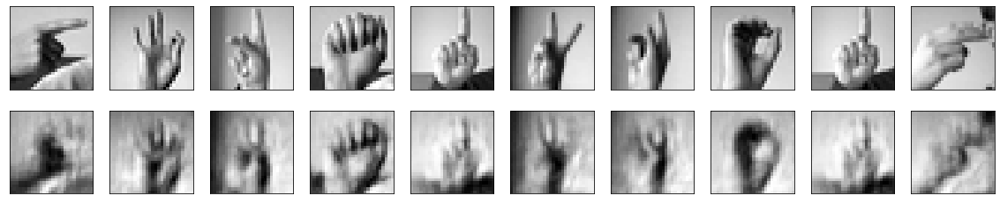

In [ ]:
# 64 dim encoding vector
n = 10  # How many digits we will display

plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(X_test_scaled[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.savefig('reconstructed-images')
plt.show()

### Train data encodings

In [ ]:
X_train_AE = encoder.predict(X_train_scaled)
print("Shape of AE compressed data = ", X_train_AE.shape)

Shape of AE compressed data =  (27455, 64)


# Machine Learning Classifiers

## Classifiers on Original Data

### Logistic Regression

In [ ]:
lr = LogisticRegression(penalty='l2', solver='lbfgs')
lr.fit(X_train_normalized, y_train)
lr_predictions = lr.predict(X_test_normalized)

print(classification_report(y_test, lr_predictions))

              precision    recall  f1-score   support

           0       0.80      1.00      0.89       331
           1       0.99      0.89      0.94       432
           2       0.86      0.86      0.86       310
           3       0.92      0.89      0.90       245
           4       0.92      0.87      0.89       498
           5       0.70      0.91      0.79       247
           6       0.82      0.77      0.80       348
           7       0.73      0.68      0.70       436
           8       0.62      0.66      0.64       288
          10       0.57      0.31      0.40       331
          11       0.59      0.84      0.70       209
          12       0.73      0.73      0.73       394
          13       0.61      0.56      0.59       291
          14       1.00      0.58      0.74       246
          15       0.89      0.97      0.93       347
          16       0.65      0.74      0.69       164
          17       0.17      0.43      0.24       144
          18       0.44    

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


### Random Forest

In [ ]:
rf = RandomForestClassifier(n_estimators=50)
rf.fit(X_train_normalized, y_train)
rf_predictions = rf.predict(X_test_normalized)

print(classification_report(y_test, rf_predictions))

              precision    recall  f1-score   support

           0       0.90      0.99      0.94       331
           1       0.96      0.90      0.93       432
           2       0.92      0.96      0.94       310
           3       0.78      0.99      0.87       245
           4       0.86      0.95      0.90       498
           5       0.88      0.91      0.89       247
           6       0.91      0.83      0.87       348
           7       0.99      0.92      0.96       436
           8       0.77      0.74      0.75       288
          10       0.67      0.66      0.67       331
          11       0.81      1.00      0.89       209
          12       0.77      0.59      0.67       394
          13       0.63      0.44      0.52       291
          14       0.88      0.81      0.84       246
          15       0.93      0.99      0.96       347
          16       0.91      0.98      0.94       164
          17       0.26      0.53      0.35       144
          18       0.56    

### Support Vector Machine

In [ ]:
param_grid = {'C': [0.1], 
              'gamma': [0.1, 0.01],
              'kernel': ['linear']}

grid = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 3)

grid.fit(X_train_normalized, y_train) 
print(grid.best_params_)

grid_predictions = grid.predict(X_test_normalized)
print(classification_report(y_test, grid_predictions))

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV 1/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=1.000 total time=  40.0s
[CV 2/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=1.000 total time=  28.1s
[CV 3/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=1.000 total time=  35.9s
[CV 4/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=1.000 total time=  32.4s
[CV 5/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=1.000 total time=  28.3s
[CV 1/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=1.000 total time=  29.9s
[CV 2/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=1.000 total time=  26.9s
[CV 3/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=1.000 total time=  29.3s
[CV 4/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=1.000 total time=  27.2s
[CV 5/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=1.000 total time=  34.6s
{'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}
              precision    recall  f1-score   support

           0       0.81      1

## Classifiers on data reduced by PCA

Applying PCA 

In [ ]:
pca = PCA(0.9)  # using 90% variance
X_train_pca = pca.fit_transform(X_train_mean_norm)

X_test_pca = pca.transform(X_test)

### Logistic Regression on PCA


In [ ]:
lr_pca = LogisticRegression(penalty='l2', solver='lbfgs')
lr_pca.fit(X_train_pca, y_train)
lr_pca_predictions = lr_pca.predict(X_test_pca)

print(classification_report(y_test, lr_pca_predictions))

              precision    recall  f1-score   support

           0       0.66      0.78      0.72       331
           1       1.00      0.63      0.78       432
           2       0.82      0.93      0.87       310
           3       0.52      0.90      0.66       245
           4       0.72      0.87      0.78       498
           5       0.38      0.79      0.51       247
           6       0.76      0.56      0.65       348
           7       0.92      0.51      0.66       436
           8       0.77      0.50      0.61       288
          10       0.44      0.52      0.48       331
          11       0.56      0.59      0.58       209
          12       0.82      0.50      0.62       394
          13       0.36      0.67      0.46       291
          14       0.47      0.66      0.55       246
          15       0.98      0.32      0.48       347
          16       0.29      0.82      0.43       164
          17       0.09      0.03      0.04       144
          18       0.22    

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


### Random Forest on PCA

In [ ]:
rf_pca = RandomForestClassifier(n_estimators=50)
rf_pca.fit(X_train_pca, y_train)
rf_pca_predictions = rf_pca.predict(X_test_pca)
print(classification_report(y_test, rf_pca_predictions))

              precision    recall  f1-score   support

           0       0.94      0.93      0.93       331
           1       0.97      0.74      0.84       432
           2       0.88      0.93      0.90       310
           3       0.60      0.50      0.54       245
           4       0.86      0.86      0.86       498
           5       0.76      0.72      0.74       247
           6       0.77      0.70      0.73       348
           7       0.91      0.81      0.86       436
           8       0.52      0.26      0.35       288
          10       0.44      0.61      0.51       331
          11       0.72      0.69      0.71       209
          12       0.52      0.38      0.44       394
          13       0.68      0.25      0.37       291
          14       0.76      0.52      0.62       246
          15       0.31      0.97      0.47       347
          16       0.29      0.99      0.45       164
          17       0.38      0.35      0.36       144
          18       0.43    

### Support Vector Machine on PCA

In [ ]:
param_grid = {'C': [0.1], 
              'gamma': [0.1, 0.01],
              'kernel': ['linear']}

grid_pca = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 3)

grid_pca.fit(X_train_pca, y_train) 
print(grid_pca.best_params_)

grid_pca_predictions = grid_pca.predict(X_test_pca)
print(classification_report(y_test, grid_pca_predictions))

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV 1/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=1.000 total time=   8.5s
[CV 2/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=1.000 total time=   8.4s
[CV 3/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=1.000 total time=   8.3s
[CV 4/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=1.000 total time=   8.3s
[CV 5/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=1.000 total time=   8.3s
[CV 1/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=1.000 total time=   8.3s
[CV 2/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=1.000 total time=   8.3s
[CV 3/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=1.000 total time=   8.4s
[CV 4/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=1.000 total time=   8.4s
[CV 5/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=1.000 total time=   8.3s
{'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}
              precision    recall  f1-score   support

           0       0.98      0

## Classifiers on data reduced by LDA

In [ ]:
lda = LinearDiscriminantAnalysis() 
lda.fit(X_train_mean_norm, y_train)

LinearDiscriminantAnalysis()

In [ ]:
lda.score(X_test, y_test)

0.4230340211935304

In [ ]:
X_train_lda = lda.transform(X_train)
X_test_lda = lda.transform(X_test)

### Logistic Regression on LDA

In [ ]:
lr_lda = LogisticRegression(penalty='l2', solver='lbfgs')
lr_lda.fit(X_train_lda, y_train)
lr_lda_predictions = lr_lda.predict(X_test_lda)

print(classification_report(y_test, lr_lda_predictions))

              precision    recall  f1-score   support

           0       0.58      0.76      0.66       331
           1       0.62      0.66      0.64       432
           2       0.82      0.75      0.78       310
           3       0.45      0.60      0.51       245
           4       0.80      0.61      0.69       498
           5       0.32      0.35      0.34       247
           6       0.56      0.38      0.45       348
           7       0.68      0.48      0.56       436
           8       0.23      0.19      0.21       288
          10       0.27      0.34      0.30       331
          11       0.29      0.27      0.28       209
          12       0.29      0.18      0.22       394
          13       0.28      0.28      0.28       291
          14       0.52      0.33      0.40       246
          15       0.85      0.10      0.17       347
          16       0.32      0.40      0.35       164
          17       0.00      0.01      0.00       144
          18       0.17    

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


### Random Forest on LDA

In [ ]:
rf_lda = RandomForestClassifier(n_estimators=50)
rf_lda.fit(X_train_lda, y_train)
rf_lda_predictions = rf_lda.predict(X_test_lda)
print(classification_report(y_test, rf_lda_predictions))

              precision    recall  f1-score   support

           0       0.53      0.78      0.63       331
           1       0.67      0.70      0.69       432
           2       0.83      0.74      0.78       310
           3       0.39      0.45      0.42       245
           4       0.74      0.58      0.65       498
           5       0.38      0.47      0.42       247
           6       0.52      0.42      0.47       348
           7       0.53      0.51      0.52       436
           8       0.15      0.16      0.15       288
          10       0.32      0.31      0.32       331
          11       0.33      0.27      0.30       209
          12       0.29      0.23      0.25       394
          13       0.25      0.13      0.17       291
          14       0.48      0.46      0.47       246
          15       0.39      0.25      0.31       347
          16       0.23      0.52      0.32       164
          17       0.01      0.01      0.01       144
          18       0.18    

### Support Vector Machine on LDA

In [ ]:
param_grid = {'C': [0.1], 
              'gamma': [0.1, 0.01],
              'kernel': ['linear']}

grid_lda = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 3)

grid_lda.fit(X_train_lda, y_train) 
print(grid_lda.best_params_)
grid_predictions_lda = grid_lda.predict(X_test_lda)
print(classification_report(y_test, grid_predictions_lda))

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV 1/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=0.999 total time=   0.9s
[CV 2/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=0.999 total time=   0.9s
[CV 3/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=0.999 total time=   0.9s
[CV 4/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=1.000 total time=   0.9s
[CV 5/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=0.999 total time=   0.9s
[CV 1/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=0.999 total time=   0.9s
[CV 2/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=0.999 total time=   0.9s
[CV 3/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=0.999 total time=   0.9s
[CV 4/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=1.000 total time=   0.9s
[CV 5/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=0.999 total time=   0.9s
{'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}
              precision    recall  f1-score   support

           0       0.55      0

## Classifiers on data reduced by Autoencoder

In [ ]:
# Encoding letters
encoded_imgs_train = encoder.predict(X_train_scaled)
encoded_imgs_test = encoder.predict(X_test_scaled)

### Logistic Regression on AE

In [ ]:
lr_ae = LogisticRegression(penalty='l2', solver='lbfgs')
lr_ae.fit(encoded_imgs_train, y_train)
lr_ae_predictions = lr_ae.predict(encoded_imgs_test)
print(classification_report(y_test, lr_ae_predictions))

              precision    recall  f1-score   support

           0       0.93      0.89      0.91       331
           1       0.95      0.90      0.93       432
           2       0.88      0.96      0.92       310
           3       0.91      0.83      0.87       245
           4       0.77      0.84      0.80       498
           5       0.73      0.76      0.74       247
           6       0.61      0.60      0.60       348
           7       0.88      0.73      0.80       436
           8       0.50      0.65      0.57       288
          10       0.58      0.47      0.52       331
          11       0.60      0.91      0.72       209
          12       0.59      0.40      0.47       394
          13       0.48      0.52      0.50       291
          14       0.61      0.45      0.52       246
          15       0.85      1.00      0.92       347
          16       0.69      0.87      0.77       164
          17       0.26      0.28      0.27       144
          18       0.15    

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


### Random Forest on AE

In [ ]:
rf_ae = RandomForestClassifier(n_estimators=50)
rf_ae.fit(encoded_imgs_train, y_train)
rf_ae_predictions = rf_ae.predict(encoded_imgs_test)
print(classification_report(y_test, rf_ae_predictions))

              precision    recall  f1-score   support

           0       0.87      0.99      0.93       331
           1       0.88      0.89      0.88       432
           2       0.94      1.00      0.97       310
           3       0.74      0.91      0.82       245
           4       0.87      0.98      0.92       498
           5       0.94      0.88      0.91       247
           6       0.91      0.88      0.89       348
           7       0.97      0.93      0.95       436
           8       0.77      0.65      0.70       288
          10       0.65      0.63      0.64       331
          11       0.77      0.94      0.85       209
          12       0.76      0.62      0.68       394
          13       0.68      0.49      0.57       291
          14       0.92      0.91      0.91       246
          15       0.90      1.00      0.95       347
          16       0.80      0.90      0.85       164
          17       0.36      0.60      0.45       144
          18       0.56    

### Support Vector Machine on AE

In [ ]:
param_grid = {'C': [0.1], 
              'gamma': [0.1, 0.01],
              'kernel': ['linear']}

grid_ae = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 3)

grid_ae.fit(encoded_imgs_train, y_train) 
print(grid_ae.best_params_)
grid_ae_predictions = grid_ae.predict(encoded_imgs_test)
print(classification_report(y_test, grid_ae_predictions))

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV 1/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=0.947 total time=  10.2s
[CV 2/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=0.953 total time=  10.4s
[CV 3/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=0.945 total time=  10.3s
[CV 4/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=0.951 total time=  10.5s
[CV 5/5] END ...C=0.1, gamma=0.1, kernel=linear;, score=0.954 total time=  10.4s
[CV 1/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=0.947 total time=  10.8s
[CV 2/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=0.953 total time=  10.5s
[CV 3/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=0.945 total time=  10.4s
[CV 4/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=0.951 total time=  11.1s
[CV 5/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=0.954 total time=  13.5s
{'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}
              precision    recall  f1-score   support

           0       0.88      1

# CNN

## Reshaping data for Model Training

In [ ]:
# Reshaping training data
X_train_normalized = X_train_normalized.reshape(-1, 28, 28, 1)
print("Shape of reshaped X_train_normalized data = ", X_train_normalized.shape)

# Onehot encoding of labels
enc = OneHotEncoder(sparse=False)
enc.fit(y_train.reshape(-1, 1))
y_train_one_hot = enc.transform(y_train.reshape(-1, 1))
y_train_one_hot = y_train_one_hot.astype(np.int32)

print("Shape of one hot encoded y_train = ", y_train_one_hot.shape)

Shape of reshaped X_train_normalized data =  (27455, 28, 28, 1)
Shape of one hot encoded y_train =  (27455, 24)


In [ ]:
# Reshaping test data
X_test_normalized = X_test_normalized.reshape(-1, 28, 28, 1)
print("Shape of reshaped X_test_normalized data = ", X_test_normalized.shape)

y_test_one_hot = enc.transform(y_test.reshape(-1, 1))
y_test_one_hot = y_test_one_hot.astype(np.int32)

print("Shape of one hot encoded y_test = ", y_test_one_hot.shape)

Shape of reshaped X_test_normalized data =  (7172, 28, 28, 1)
Shape of one hot encoded y_test =  (7172, 24)


# Model

## Model Building

In [ ]:
inputs = keras.Input(shape=(28, 28, 1), name="img")
x = layers.Conv2D(20, 3, activation="relu", kernel_regularizer=L2(1e-3))(inputs)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(24, 3, activation="relu", kernel_regularizer=L2(1e-3))(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.2)(x)
block_1_output = layers.MaxPooling2D(3)(x)

x = layers.Conv2D(24, 3, activation="relu", kernel_regularizer=L2(1e-3), padding="same")(block_1_output)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(24, 3, activation="relu", kernel_regularizer=L2(1e-3), padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.2)(x)

# Skip connection
block_2_output = layers.add([x, block_1_output])

x = layers.Conv2D(24, 3, activation="relu", kernel_regularizer=L2(1e-3), name='last_conv2d_layer')(block_2_output)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(24, activation="relu", kernel_regularizer=L2(1e-3))(x)
outputs = layers.Dense(24, activation = 'softmax')(x)

model = keras.Model(inputs, outputs, name="Resnet")
model.summary()

Model: "Resnet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 img (InputLayer)               [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 26, 26, 20)   200         ['img[0][0]']                    
                                                                                                  
 batch_normalization (BatchNorm  (None, 26, 26, 20)  80          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 conv2d_1 (Conv2D)              (None, 24, 24, 24)   4344        ['batch_normalization[0][0]'

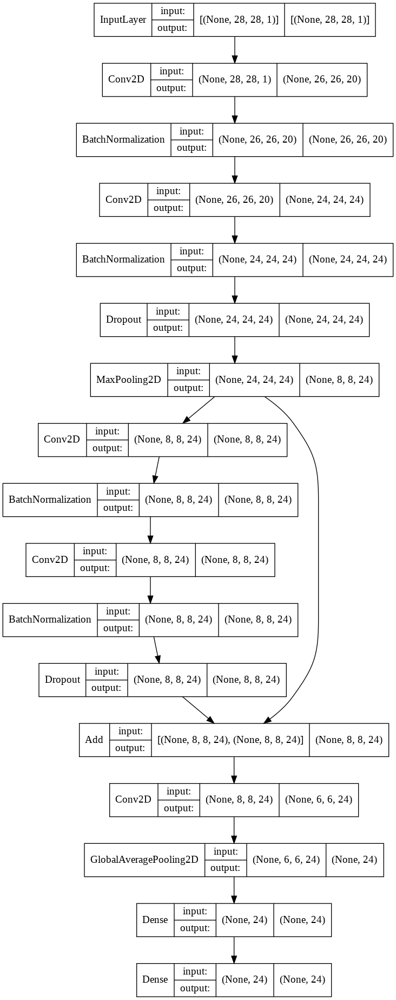

In [ ]:
keras.utils.plot_model(model,
                       "mini_resnet.png",
                       show_shapes=True,
                       show_layer_names=False)

## Model Compilation

In [ ]:
model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss=keras.losses.CategoricalCrossentropy(from_logits=False),
    metrics=["acc"],
)

## Callbacks

In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.001)

early_stop = EarlyStopping(monitor='val_loss', patience=3)

checkpoint_filepath = "/content/drive/MyDrive/SYDE 522 Project/Checkpoint/checkpoint_1"
model_checkpoint = ModelCheckpoint(filepath=checkpoint_filepath,
                                    save_weights_only=True,
                                    monitor='val_acc',
                                    mode='max',
                                    save_best_only=True)

# Clear any logs from previous runs
# !rm -rf "/content/drive/MyDrive/SYDE 522 Project/Tensorboard/logs/"
log_dir = "/content/drive/MyDrive/SYDE 522 Project/Tensorboard/" + "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir,
                                   histogram_freq=1,
                                   profile_batch=10)

callbacks = [reduce_lr, early_stop, model_checkpoint, tensorboard_callback]

## Model Fitting

In [ ]:
epochs = 10

In [ ]:
start = time()

history = model.fit(X_train_normalized, y_train_one_hot,
                    epochs=epochs,
                    validation_split=0.2,
                    batch_size=64,
                    callbacks=callbacks)

end = time()

Epoch 1/10
344/344 [==============================] - 9s 18ms/step - loss: 1.6413 - acc: 0.5297 - val_loss: 1.7041 - val_acc: 0.5137 - lr: 0.0010
Epoch 2/10
344/344 [==============================] - 5s 15ms/step - loss: 0.3335 - acc: 0.9472 - val_loss: 0.2757 - val_acc: 0.9727 - lr: 0.0010
Epoch 3/10
344/344 [==============================] - 5s 14ms/step - loss: 0.1844 - acc: 0.9887 - val_loss: 0.1847 - val_acc: 0.9894 - lr: 0.0010
Epoch 4/10
344/344 [==============================] - 5s 14ms/step - loss: 0.1545 - acc: 0.9934 - val_loss: 0.1881 - val_acc: 0.9863 - lr: 0.0010
Epoch 5/10
344/344 [==============================] - 5s 14ms/step - loss: 0.1420 - acc: 0.9939 - val_loss: 0.1380 - val_acc: 0.9971 - lr: 0.0010
Epoch 6/10
344/344 [==============================] - 5s 14ms/step - loss: 0.1321 - acc: 0.9944 - val_loss: 0.1263 - val_acc: 0.9962 - lr: 0.0010
Epoch 7/10
344/344 [==============================] - 5s 14ms/step - loss: 0.1140 - acc: 0.9978 - val_loss: 0.1678 - val_acc

In [ ]:
print(f"Model training time = {round(end - start, 2)}sec")

Model training time = 52.79sec


In [ ]:
# Load the best model
model.load_weights(checkpoint_filepath)

## Plotting

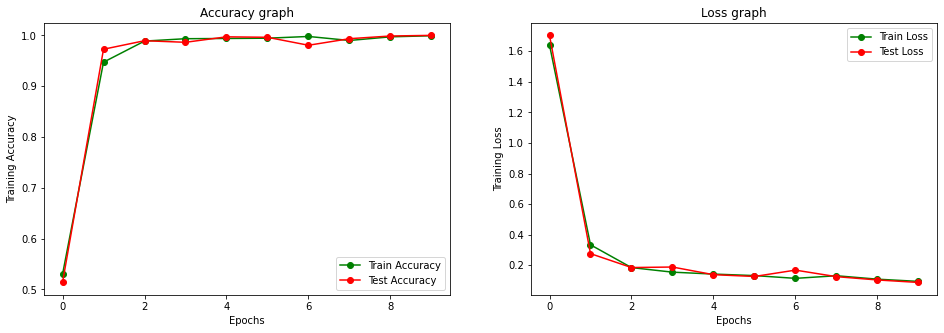

In [ ]:
nepochs = [i for i in range(epochs)]
fig , ax = plt.subplots(1, 2, figsize=(16, 5))
train_acc = history.history['acc']
train_loss = history.history['loss']
val_acc = history.history['val_acc']
val_loss = history.history['val_loss']

ax[0].plot(nepochs , train_acc , 'go-' , label = 'Train Accuracy')
ax[0].plot(nepochs , val_acc , 'ro-' , label = 'Test Accuracy')
ax[0].set_title('Accuracy graph')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Training Accuracy")

ax[1].plot(nepochs , train_loss , 'g-o' , label = 'Train Loss')
ax[1].plot(nepochs , val_loss , 'r-o' , label = 'Test Loss')
ax[1].set_title('Loss graph')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Training Loss")
plt.savefig('acc-loss-graphs')
plt.show()

## Model Evaluation

In [ ]:
# Run model prediction on test images
predictions = model.predict(X_test_normalized)

# Extract the labels of the test predictions
y_preds = np.argmax(predictions, axis=1)

for i in range(len(y_preds)):
    if(y_preds[i] >= 9):
        y_preds[i] += 1

In [ ]:
# Print loss value and accuracy for test set
score, acc = model.evaluate(X_test_normalized, y_test_one_hot)
print('Test score:', score)
print('Test accuracy:', acc)

225/225 [==============================] - 3s 7ms/step - loss: 0.1334 - acc: 0.9813
Test score: 0.13336190581321716
Test accuracy: 0.9813162088394165


### Confusion Matrix

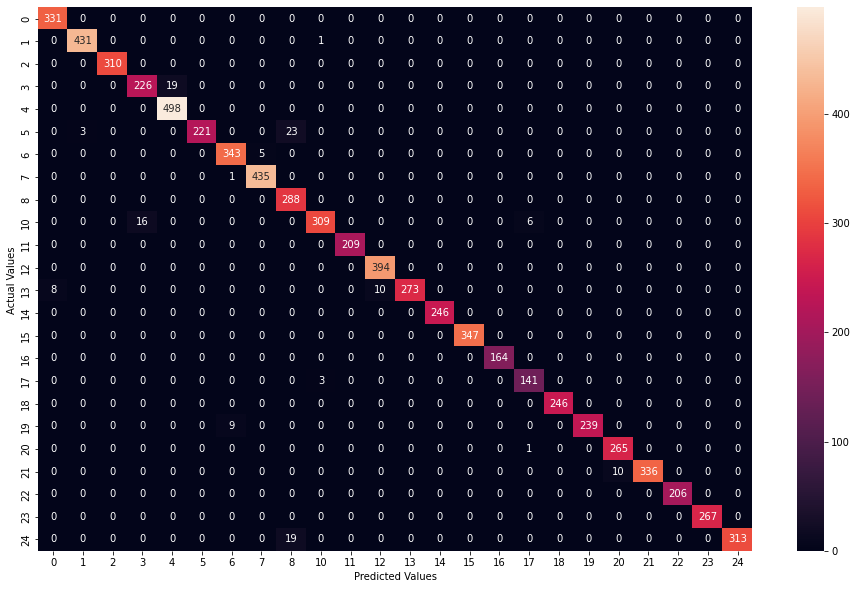

In [ ]:
# Plot confusion matrix
fig, ax = plt.subplots(1, 1, figsize=(16, 10))
con_mat = confusion_matrix(y_test, y_preds, labels=labels)
# Set indices and column names to match the labels
con_mat = pd.DataFrame(con_mat , index = [i for i in range(25) if i != 9] , columns = [i for i in range(25) if i != 9])
ax = sns.heatmap(con_mat, annot=True, fmt='d')
ax.set_xlabel('Predicted Values')
ax.set_ylabel('Actual Values ')
plt.show()

In [ ]:
# Calculate percentage of letters correctly classified for each class
correctly_classified = np.diagonal(con_mat)
total_classified = np.sum(con_mat, axis = 1)

perc_correctly_classified = correctly_classified/total_classified

print("Percentage correctly classified for each class")
table = []
table.append(labels_dict.values())
table.append(round(perc_correctly_classified, 4))

print(tabulate(table,tablefmt='grid'))

lowest_class = np.argmin(perc_correctly_classified)

if lowest_class >= 9:
    lowest_class += 1

print("\nLetter that is particularly tricky to classify: ", labels_dict[lowest_class])

Percentage correctly classified for each class
+-----+--------+-----+--------+-----+--------+--------+--------+-----+--------+-----+-----+--------+-----+-----+-----+--------+-----+--------+--------+--------+-----+-----+--------+
| A   | B      | C   | D      | E   | F      | G      | H      | I   | K      | L   | M   | N      | O   | P   | Q   | R      | S   | T      | U      | V      | W   | X   | Y      |
+-----+--------+-----+--------+-----+--------+--------+--------+-----+--------+-----+-----+--------+-----+-----+-----+--------+-----+--------+--------+--------+-----+-----+--------+
| 1.0 | 0.9977 | 1.0 | 0.9224 | 1.0 | 0.8947 | 0.9856 | 0.9977 | 1.0 | 0.9335 | 1.0 | 1.0 | 0.9381 | 1.0 | 1.0 | 1.0 | 0.9792 | 1.0 | 0.9637 | 0.9962 | 0.9711 | 1.0 | 1.0 | 0.9428 |
+-----+--------+-----+--------+-----+--------+--------+--------+-----+--------+-----+-----+--------+-----+-----+-----+--------+-----+--------+--------+--------+-----+-----+--------+

Letter that is particularly tricky to clas

### Classification report

In [ ]:
print(classification_report(y_test, y_preds, labels=labels, target_names=labels_dict.values()))

              precision    recall  f1-score   support

           A       0.98      1.00      0.99       331
           B       0.99      1.00      1.00       432
           C       1.00      1.00      1.00       310
           D       0.93      0.92      0.93       245
           E       0.96      1.00      0.98       498
           F       1.00      0.89      0.94       247
           G       0.97      0.99      0.98       348
           H       0.99      1.00      0.99       436
           I       0.87      1.00      0.93       288
           K       0.99      0.93      0.96       331
           L       1.00      1.00      1.00       209
           M       0.98      1.00      0.99       394
           N       1.00      0.94      0.97       291
           O       1.00      1.00      1.00       246
           P       1.00      1.00      1.00       347
           Q       1.00      1.00      1.00       164
           R       0.95      0.98      0.97       144
           S       1.00    

## Misclassified Images

In [ ]:
# Misclassified indices
indices = np.where(y_preds != y_test)[0]
print(indices)

[   1   29   32   45   88  119  234  299  343  359  361  425  489  558
  638  674  696  729  742  753  783  843  912  948 1014 1062 1146 1155
 1202 1269 1363 1369 1462 1520 1593 1730 1777 1827 1884 1914 1973 1993
 1998 2035 2065 2141 2165 2174 2195 2239 2248 2310 2562 2759 2825 2831
 2859 2860 2864 3005 3058 3093 3199 3239 3358 3361 3385 3414 3489 3496
 3637 3650 3674 3715 3791 3857 3975 4008 4013 4031 4091 4102 4137 4214
 4227 4322 4488 4490 4635 4678 4736 4796 4835 4865 4949 4975 4998 5150
 5177 5206 5240 5334 5398 5487 5530 5544 5561 5577 5605 5723 5795 5827
 5883 5936 5939 5959 5967 6110 6148 6219 6246 6247 6262 6296 6328 6338
 6425 6476 6513 6569 6777 7108 7149 7162]


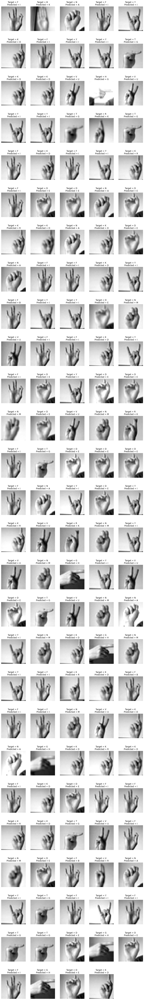

In [ ]:
# Plot the misclassified images
rows = np.ceil(len(indices)/5)
fig = plt.figure(figsize=(15, rows*4))

for i, idx in enumerate(indices):
    ax = fig.add_subplot(rows, 5, i+1)
    ax.imshow(X_test[idx].reshape(28,28), cmap=plt.get_cmap("gray"))
    ax.set_title(f"Target = {labels_dict[y_test[idx]]} \n Predicted = {labels_dict[y_preds[idx]]}")
    ax.axis('off')

plt.show()

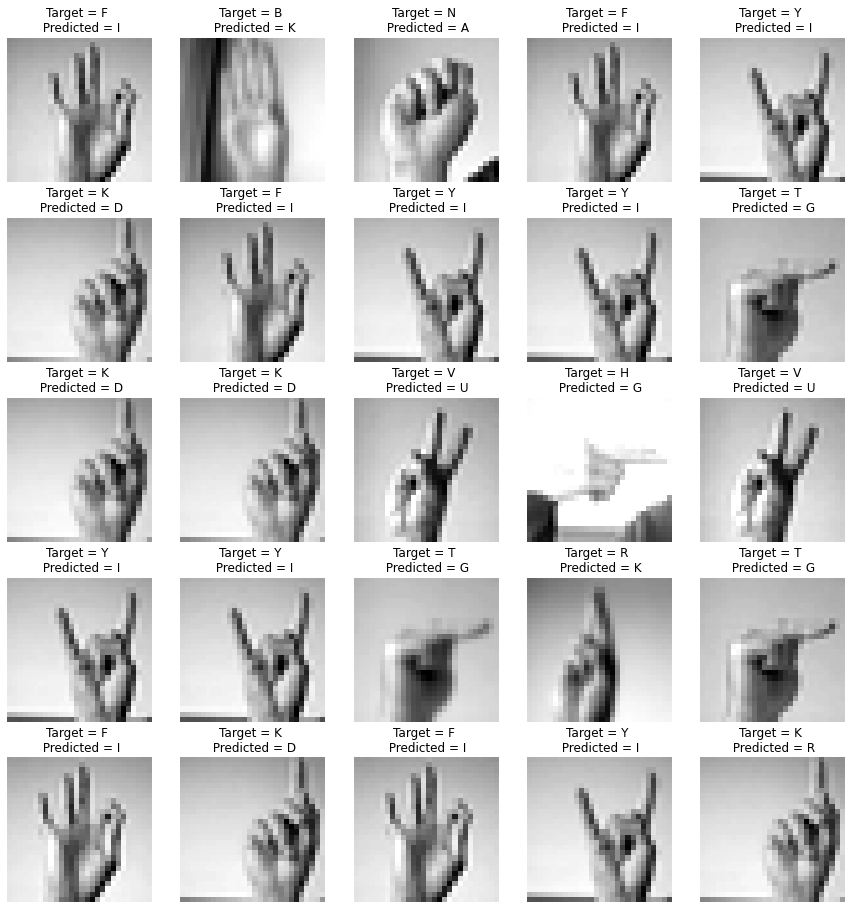

In [ ]:
# Plot the misclassified images
rows = np.ceil(len(indices[:25])/5)
fig = plt.figure(figsize=(15, 16))

for i, idx in enumerate(indices[:25]):
    ax = fig.add_subplot(rows, 5, i+1)
    ax.imshow(X_test[idx].reshape(28,28), cmap=plt.get_cmap("gray"))
    ax.set_title(f"Target = {labels_dict[y_test[idx]]} \n Predicted = {labels_dict[y_preds[idx]]}")
    ax.axis('off')
plt.savefig("misclassifications")
plt.show()

## Tensorboard

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/SYDE 522 Project/Tensorboard/logs/fit/"

Reusing TensorBoard on port 6006 (pid 446), started 0:13:00 ago. (Use '!kill 446' to kill it.)

<IPython.core.display.Javascript object>

## GradCAM


In [ ]:
for layer in model.layers:
    print(layer.name)

img
conv2d
batch_normalization
conv2d_1
batch_normalization_1
dropout
max_pooling2d
conv2d_2
batch_normalization_2
conv2d_3
batch_normalization_3
dropout_1
add
last_conv2d_layer
global_average_pooling2d
dense_6
dense_7


In [ ]:
last_conv_layer_name = "last_conv2d_layer"

In [ ]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

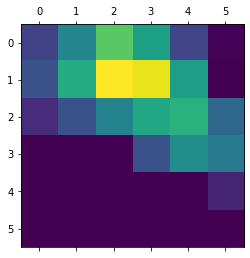

In [ ]:
# Generate class activation heatmap
heatmap = make_gradcam_heatmap(X_test_normalized[0].reshape(1, 28, 28, 1), model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap, cmap='viridis')
plt.show()

In [ ]:
# Save the test image as .jpg file
im = PIL_Image.fromarray(X_test[0].reshape(28, 28).astype(np.uint8))
im.save("pic.jpg")

In [ ]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    # display(Image(cam_path))
    img = plt.imread(cam_path)
    # plt.imshow(img)

    return img

x = save_and_display_gradcam('pic.jpg', heatmap)

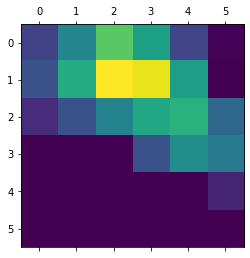

In [ ]:
# Generate class activation heatmap
heatmap = make_gradcam_heatmap(X_test_normalized[0].reshape(1, 28, 28, 1), model, last_conv_layer_name)
# heatmap = make_gradcam_heatmap('img.jpg', model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap, cmap='viridis')
plt.show()

x = save_and_display_gradcam('pic.jpg', heatmap)

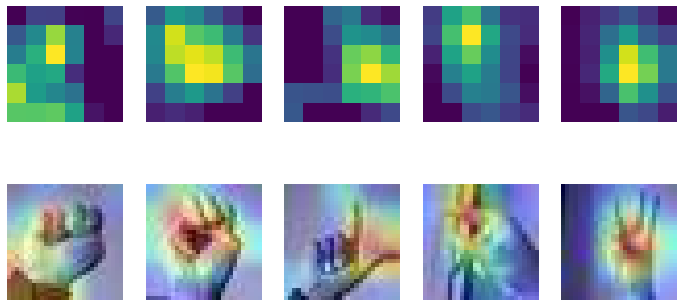

In [ ]:
# Create subplots
fig, ax = plt.subplots(2, 5, figsize=(12, 6))
ax = ax.flatten()

test_range = len(X_test)
# for loop to display one of each letter
# Iterate over each label
for i in range(5):
    idx = random.randint(0, test_range)
    # print(idx)
    heatmap = make_gradcam_heatmap(X_test_normalized[idx].reshape(1, 28, 28, 1), model, last_conv_layer_name)

    ax[i].matshow(heatmap, cmap='viridis')

    im = PIL_Image.fromarray(X_test[idx].reshape(28, 28).astype(np.uint8))
    im.save(f"pic_{idx}.jpg")
    # ax[i].set_title(f'{labels_dict[label]}')
    img = save_and_display_gradcam(f'pic_{idx}.jpg', heatmap)
    ax[i+5].imshow(img)
    
    ax[i].axis('off')
    ax[i+5].axis('off')

plt.savefig("grad-cam")
plt.show()

# Model without skipconnection

## Model Building

In [ ]:
inputs = keras.Input(shape=(28, 28, 1), name="img")
x = layers.Conv2D(20, 3, activation="relu", kernel_regularizer=L2(1e-3))(inputs)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(24, 3, activation="relu", kernel_regularizer=L2(1e-3))(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.2)(x)
block_1_output = layers.MaxPooling2D(3)(x)

x = layers.Conv2D(24, 3, activation="relu", kernel_regularizer=L2(1e-3), padding="same")(block_1_output)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(24, 3, activation="relu", kernel_regularizer=L2(1e-3), padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.2)(x)

# No skip connection
block_2_output = x

x = layers.Conv2D(24, 3, activation="relu", kernel_regularizer=L2(1e-3), name='last_conv2d_layer')(block_2_output)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(24, activation="relu", kernel_regularizer=L2(1e-3))(x)
outputs = layers.Dense(24, activation = 'softmax')(x)

model = keras.Model(inputs, outputs, name="Resnet")
model.summary()

Model: "Resnet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 img (InputLayer)            [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 26, 26, 20)        200       
                                                                 
 batch_normalization_4 (Batc  (None, 26, 26, 20)       80        
 hNormalization)                                                 
                                                                 
 conv2d_5 (Conv2D)           (None, 24, 24, 24)        4344      
                                                                 
 batch_normalization_5 (Batc  (None, 24, 24, 24)       96        
 hNormalization)                                                 
                                                                 
 dropout_2 (Dropout)         (None, 24, 24, 24)        0    

## Model Compilation

In [ ]:
model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss=keras.losses.CategoricalCrossentropy(from_logits=False),
    metrics=["acc"],
)

## Callbacks

In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.001)

early_stop = EarlyStopping(monitor='val_loss', patience=3)

checkpoint_filepath = "/content/drive/MyDrive/SYDE 522 Project/Checkpoint/checkpoint_2"
model_checkpoint = ModelCheckpoint(filepath=checkpoint_filepath,
                                    save_weights_only=True,
                                    monitor='val_acc',
                                    mode='max',
                                    save_best_only=True)

callbacks = [reduce_lr, early_stop, model_checkpoint]

## Model Fitting

In [ ]:
epochs = 10

In [ ]:
start = time()

history = model.fit(X_train_normalized, y_train_one_hot,
                    epochs=epochs,
                    validation_split=0.2,
                    batch_size=64,
                    callbacks=callbacks)

end = time()

Epoch 1/10
344/344 [==============================] - 7s 16ms/step - loss: 1.5259 - acc: 0.5763 - val_loss: 1.5753 - val_acc: 0.5420 - lr: 0.0010
Epoch 2/10
344/344 [==============================] - 5s 15ms/step - loss: 0.3228 - acc: 0.9593 - val_loss: 0.3298 - val_acc: 0.9528 - lr: 0.0010
Epoch 3/10
344/344 [==============================] - 5s 14ms/step - loss: 0.2015 - acc: 0.9917 - val_loss: 0.3274 - val_acc: 0.9414 - lr: 0.0010
Epoch 4/10
344/344 [==============================] - 5s 14ms/step - loss: 0.1745 - acc: 0.9938 - val_loss: 0.1818 - val_acc: 0.9873 - lr: 0.0010
Epoch 5/10
344/344 [==============================] - 5s 14ms/step - loss: 0.1506 - acc: 0.9967 - val_loss: 0.1634 - val_acc: 0.9914 - lr: 0.0010
Epoch 6/10
344/344 [==============================] - 5s 14ms/step - loss: 0.1314 - acc: 0.9980 - val_loss: 0.2536 - val_acc: 0.9570 - lr: 0.0010
Epoch 7/10
344/344 [==============================] - 5s 14ms/step - loss: 0.1283 - acc: 0.9961 - val_loss: 0.1626 - val_acc

In [ ]:
print(f"Model training time = {round(end - start, 2)}sec")

Model training time = 83.63sec


In [ ]:
# Load the best model
model.load_weights(checkpoint_filepath)

## Plotting

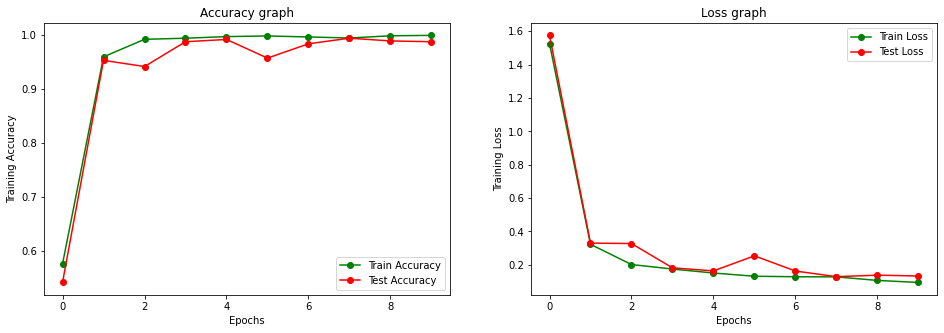

In [ ]:
nepochs = [i for i in range(epochs)]
fig , ax = plt.subplots(1, 2, figsize=(16, 5))
train_acc = history.history['acc']
train_loss = history.history['loss']
val_acc = history.history['val_acc']
val_loss = history.history['val_loss']

ax[0].plot(nepochs , train_acc , 'go-' , label = 'Train Accuracy')
ax[0].plot(nepochs , val_acc , 'ro-' , label = 'Test Accuracy')
ax[0].set_title('Accuracy graph')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Training Accuracy")

ax[1].plot(nepochs , train_loss , 'g-o' , label = 'Train Loss')
ax[1].plot(nepochs , val_loss , 'r-o' , label = 'Test Loss')
ax[1].set_title('Loss graph')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Training Loss")
plt.savefig('acc-loss-graphs')
plt.show()

## Model Evaluation

In [ ]:
# Run model prediction on test images
predictions = model.predict(X_test_normalized)

# Extract the labels of the test predictions
y_preds = np.argmax(predictions, axis=1)

for i in range(len(y_preds)):
    if(y_preds[i] >= 9):
        y_preds[i] += 1

In [ ]:
# Print loss value and accuracy for test set
score, acc = model.evaluate(X_test_normalized, y_test_one_hot)
print('Test score:', score)
print('Test accuracy:', acc)

225/225 [==============================] - 1s 6ms/step - loss: 0.2203 - acc: 0.9677
Test score: 0.22034399211406708
Test accuracy: 0.9676519632339478


### Confusion Matrix

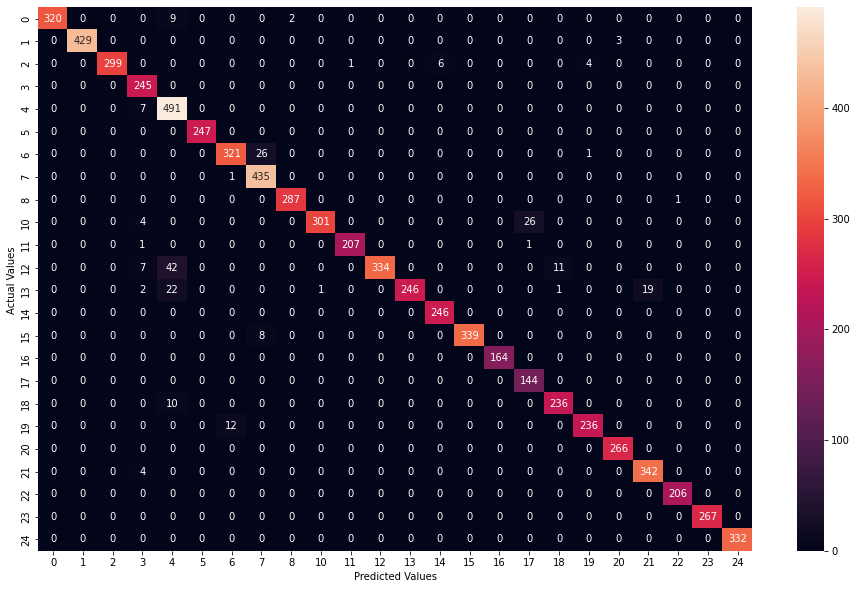

In [ ]:
# Plot confusion matrix
fig, ax = plt.subplots(1, 1, figsize=(16, 10))
con_mat = confusion_matrix(y_test, y_preds, labels=labels)
# Set indices and column names to match the labels
con_mat = pd.DataFrame(con_mat , index = [i for i in range(25) if i != 9] , columns = [i for i in range(25) if i != 9])
ax = sns.heatmap(con_mat, annot=True, fmt='d')
ax.set_xlabel('Predicted Values')
ax.set_ylabel('Actual Values ')
plt.show()

In [ ]:
# Calculate percentage of letters correctly classified for each class
correctly_classified = np.diagonal(con_mat)
total_classified = np.sum(con_mat, axis = 1)

perc_correctly_classified = correctly_classified/total_classified

print("Percentage correctly classified for each class")
table = []
table.append(labels_dict.values())
table.append(round(perc_correctly_classified, 4))

print(tabulate(table,tablefmt='grid'))

lowest_class = np.argmin(perc_correctly_classified)

if lowest_class >= 9:
    lowest_class += 1

print("\nLetter that is particularly tricky to classify: ", labels_dict[lowest_class])

Percentage correctly classified for each class
+--------+--------+--------+-----+--------+-----+--------+--------+--------+--------+--------+--------+--------+-----+--------+-----+-----+--------+--------+-----+--------+-----+-----+-----+
| A      | B      | C      | D   | E      | F   | G      | H      | I      | K      | L      | M      | N      | O   | P      | Q   | R   | S      | T      | U   | V      | W   | X   | Y   |
+--------+--------+--------+-----+--------+-----+--------+--------+--------+--------+--------+--------+--------+-----+--------+-----+-----+--------+--------+-----+--------+-----+-----+-----+
| 0.9668 | 0.9931 | 0.9645 | 1.0 | 0.9859 | 1.0 | 0.9224 | 0.9977 | 0.9965 | 0.9094 | 0.9904 | 0.8477 | 0.8454 | 1.0 | 0.9769 | 1.0 | 1.0 | 0.9593 | 0.9516 | 1.0 | 0.9884 | 1.0 | 1.0 | 1.0 |
+--------+--------+--------+-----+--------+-----+--------+--------+--------+--------+--------+--------+--------+-----+--------+-----+-----+--------+--------+-----+--------+-----+-----+-----

### Classification report

In [ ]:
print(classification_report(y_test, y_preds, labels=labels, target_names=labels_dict.values()))

              precision    recall  f1-score   support

           A       1.00      0.97      0.98       331
           B       1.00      0.99      1.00       432
           C       1.00      0.96      0.98       310
           D       0.91      1.00      0.95       245
           E       0.86      0.99      0.92       498
           F       1.00      1.00      1.00       247
           G       0.96      0.92      0.94       348
           H       0.93      1.00      0.96       436
           I       0.99      1.00      0.99       288
           K       1.00      0.91      0.95       331
           L       1.00      0.99      0.99       209
           M       1.00      0.85      0.92       394
           N       1.00      0.85      0.92       291
           O       0.98      1.00      0.99       246
           P       1.00      0.98      0.99       347
           Q       1.00      1.00      1.00       164
           R       0.84      1.00      0.91       144
           S       0.95    

## Misclassified Images

In [ ]:
# Misclassified indices
indices = np.where(y_preds != y_test)[0]
print(indices)

[  49   60   61   78  123  124  170  224  237  270  366  405  444  445
  449  501  506  563  583  652  662  668  686  729  746  757  825  837
  846  869  911  931  961 1013 1038 1045 1092 1096 1101 1128 1161 1212
 1247 1330 1353 1366 1391 1491 1492 1538 1599 1662 1664 1674 1723 1754
 1823 1897 1920 1921 1947 2028 2041 2069 2099 2104 2151 2157 2201 2227
 2264 2351 2374 2377 2431 2445 2482 2484 2536 2599 2607 2636 2657 2724
 2745 2760 2781 2791 2831 2846 2857 2869 2876 2962 2981 2983 3017 3022
 3031 3061 3068 3069 3082 3116 3123 3242 3293 3311 3336 3434 3461 3467
 3497 3528 3625 3633 3769 3776 3784 3798 3822 3831 3851 3864 3867 3898
 3902 3945 4002 4011 4012 4045 4122 4155 4185 4253 4266 4270 4278 4309
 4318 4340 4345 4384 4482 4496 4582 4617 4635 4648 4670 4795 4800 4835
 4872 4911 4933 4940 4986 5002 5014 5071 5132 5166 5191 5290 5291 5367
 5369 5399 5415 5445 5462 5512 5564 5565 5595 5619 5627 5676 5703 5726
 5741 5750 5783 5785 5834 5842 5855 5903 5916 5935 5959 5982 5991 6015
 6033 

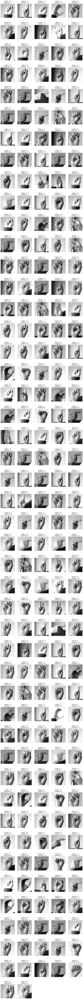

In [ ]:
# Plot the misclassified images
rows = np.ceil(len(indices)/5)
fig = plt.figure(figsize=(15, rows*4))

for i, idx in enumerate(indices):
    ax = fig.add_subplot(rows, 5, i+1)
    ax.imshow(X_test[idx].reshape(28,28), cmap=plt.get_cmap("gray"))
    ax.set_title(f"Target = {labels_dict[y_test[idx]]} \n Predicted = {labels_dict[y_preds[idx]]}")
    ax.axis('off')

plt.show()

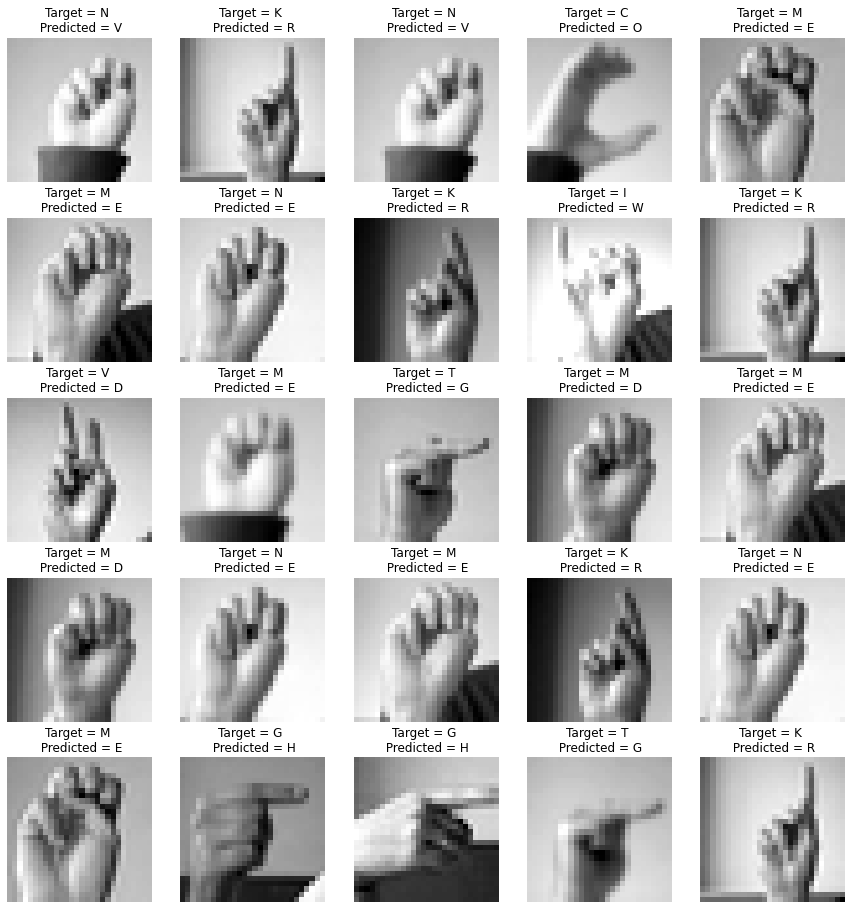

In [ ]:
# Plot the misclassified images
rows = np.ceil(len(indices[:25])/5)
fig = plt.figure(figsize=(15, 16))

for i, idx in enumerate(indices[:25]):
    ax = fig.add_subplot(rows, 5, i+1)
    ax.imshow(X_test[idx].reshape(28,28), cmap=plt.get_cmap("gray"))
    ax.set_title(f"Target = {labels_dict[y_test[idx]]} \n Predicted = {labels_dict[y_preds[idx]]}")
    ax.axis('off')
plt.savefig("misclassifications")
plt.show()